In [1]:
import pandas as pd
import numpy as np
# import matplotlib.pyplot as plt
%matplotlib inline

# Read the Dataset

In [2]:
data=pd.read_csv("data/load_data.csv")
data.head()

,Date_Time,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Load_Type
0,01-01-2018 00:15,8.753692,2.95,0.0,0.0,73.210000,100.0,900.000000,Light_Load
1,01-01-2018 00:30,4.000000,4.46,0.0,0.0,66.770000,100.0,1800.000000,Light_Load
2,01-01-2018 00:45,3.240000,3.28,0.0,0.0,70.280000,100.0,8070.880991,Light_Load
3,01-01-2018 01:00,3.310000,3.56,0.0,0.0,68.090000,100.0,3600.000000,Light_Load
4,01-01-2018 01:15,3.820000,4.50,0.0,0.0,133.655666,NaN,4500.000000,Light_Load


## Check the continutiny of date_time

In [3]:
s=pd.to_datetime(data['Date_Time'],format="%d-%m-%Y %H:%M")


In [4]:
(s+pd.Timedelta(minutes=15) -s).value_counts()

Date_Time
0 days 00:15:00    35041
Name: count, dtype: int64

The dataset has the time difference of 15 minutes with no null values in the date_time column

In [5]:
def split_date(date):
    return int((date.split(" ")[0]).split("-")[1])

In [6]:
split_date("31-12-2018 00:15")

12

In [7]:
train=data[data['Date_Time'].apply(split_date)<12]
test=data[data['Date_Time'].apply(split_date)==12]

In [8]:
train.head()

,Date_Time,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Load_Type
0,01-01-2018 00:15,8.753692,2.95,0.0,0.0,73.210000,100.0,900.000000,Light_Load
1,01-01-2018 00:30,4.000000,4.46,0.0,0.0,66.770000,100.0,1800.000000,Light_Load
2,01-01-2018 00:45,3.240000,3.28,0.0,0.0,70.280000,100.0,8070.880991,Light_Load
3,01-01-2018 01:00,3.310000,3.56,0.0,0.0,68.090000,100.0,3600.000000,Light_Load
4,01-01-2018 01:15,3.820000,4.50,0.0,0.0,133.655666,NaN,4500.000000,Light_Load


In [9]:
test.head()

,Date_Time,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Load_Type
32064,01-12-2018 00:15,3.890000,2.70,0.40,0.0,82.150000,99.480000,900.000000,Light_Load
32065,01-12-2018 00:30,6.969819,2.66,0.43,0.0,82.270000,295.495184,1800.000000,Light_Load
32066,01-12-2018 00:45,3.890000,2.77,0.36,0.0,81.460000,293.923669,7344.573356,Light_Load
32067,01-12-2018 01:00,3.890000,2.77,0.36,0.0,232.504650,99.570000,3600.000000,Light_Load
32068,01-12-2018 01:15,NaN,3.02,0.29,0.0,202.439566,99.740000,4500.000000,Light_Load


In [10]:
len(train)

32064

In [11]:
mi=int(0.8*len(train))
val=train[mi:]
train=train[:mi]

In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25651 entries, 0 to 25650
Data columns (total 9 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Date_Time                             25651 non-null  object 
 1   Usage_kWh                             24547 non-null  float64
 2   Lagging_Current_Reactive.Power_kVarh  25017 non-null  float64
 3   Leading_Current_Reactive_Power_kVarh  24804 non-null  float64
 4   CO2(tCO2)                             25312 non-null  float64
 5   Lagging_Current_Power_Factor          25380 non-null  float64
 6   Leading_Current_Power_Factor          24565 non-null  float64
 7   NSM                                   25325 non-null  float64
 8   Load_Type                             25651 non-null  object 
dtypes: float64(7), object(2)
memory usage: 2.0+ MB


In [13]:
val.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6413 entries, 25651 to 32063
Data columns (total 9 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Date_Time                             6413 non-null   object 
 1   Usage_kWh                             6122 non-null   float64
 2   Lagging_Current_Reactive.Power_kVarh  6252 non-null   float64
 3   Leading_Current_Reactive_Power_kVarh  6203 non-null   float64
 4   CO2(tCO2)                             6334 non-null   float64
 5   Lagging_Current_Power_Factor          6361 non-null   float64
 6   Leading_Current_Power_Factor          6147 non-null   float64
 7   NSM                                   6335 non-null   float64
 8   Load_Type                             6413 non-null   object 
dtypes: float64(7), object(2)
memory usage: 501.0+ KB


In [14]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2977 entries, 32064 to 35040
Data columns (total 9 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Date_Time                             2977 non-null   object 
 1   Usage_kWh                             2813 non-null   float64
 2   Lagging_Current_Reactive.Power_kVarh  2896 non-null   float64
 3   Leading_Current_Reactive_Power_kVarh  2878 non-null   float64
 4   CO2(tCO2)                             2940 non-null   float64
 5   Lagging_Current_Power_Factor          2950 non-null   float64
 6   Leading_Current_Power_Factor          2858 non-null   float64
 7   NSM                                   2926 non-null   float64
 8   Load_Type                             2977 non-null   object 
dtypes: float64(7), object(2)
memory usage: 232.6+ KB


In [15]:
#save train and test to csv files
train.to_csv("data/train.csv",index=False)
test.to_csv("data/test.csv",index=False)
val.to_csv("data/val.csv",index=False)

In [16]:
train.head()

,Date_Time,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Load_Type
0,01-01-2018 00:15,8.753692,2.95,0.0,0.0,73.210000,100.0,900.000000,Light_Load
1,01-01-2018 00:30,4.000000,4.46,0.0,0.0,66.770000,100.0,1800.000000,Light_Load
2,01-01-2018 00:45,3.240000,3.28,0.0,0.0,70.280000,100.0,8070.880991,Light_Load
3,01-01-2018 01:00,3.310000,3.56,0.0,0.0,68.090000,100.0,3600.000000,Light_Load
4,01-01-2018 01:15,3.820000,4.50,0.0,0.0,133.655666,NaN,4500.000000,Light_Load


# First Analysis

## Null or Missing values

In [17]:
train.isna().sum()

Date_Time                                  0
Usage_kWh                               1104
Lagging_Current_Reactive.Power_kVarh     634
Leading_Current_Reactive_Power_kVarh     847
CO2(tCO2)                                339
Lagging_Current_Power_Factor             271
Leading_Current_Power_Factor            1086
NSM                                      326
Load_Type                                  0
dtype: int64

In [18]:
train.isna().sum()/len(train)*100

Date_Time                               0.000000
Usage_kWh                               4.303926
Lagging_Current_Reactive.Power_kVarh    2.471639
Leading_Current_Reactive_Power_kVarh    3.302016
CO2(tCO2)                               1.321586
Lagging_Current_Power_Factor            1.056489
Leading_Current_Power_Factor            4.233753
NSM                                     1.270906
Load_Type                               0.000000
dtype: float64

In [19]:
train.Load_Type.value_counts()/train.shape[0]*100

Load_Type
Light_Load      51.097423
Medium_Load     27.944330
Maximum_Load    20.958247
Name: count, dtype: float64

## Findings from the report of EDA from ProfileReport



In [20]:
!pip install ydata_profiling

In [21]:
import pandas as pd
from ydata_profiling import ProfileReport

profile = ProfileReport(train, title="Profiling Report")
profile


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


- Usage_kWh has 1395 (4.4%) missing values	Missing
- Lagging_Current_Reactive.Power_kVarh has 795 (2.5%) missing values	Missing
- Leading_Current_Reactive_Power_kVarh has 1057 (3.3%) missing values	Missing
- CO2(tCO2) has 418 (1.3%) missing values	Missing
- Lagging_Current_Power_Factor has 323 (1.0%) missing values	Missing
- Leading_Current_Power_Factor has 1352 (4.2%) missing values	Missing
- NSM has 404 (1.3%) missing values	Missing
- Date_Time has unique values	Unique
- Lagging_Current_Reactive.Power_kVarh has 6193 (19.3%) zeros	Zeros
- Leading_Current_Reactive_Power_kVarh has 21666 (67.6%) zeros	Zeros
- CO2(tCO2) has 18638 (58.1%) zeros	Zeros
- NSM has 329 (1.0%) zeros

In [22]:
!pip install sweetviz

                                             |          | [  0%]   00:00 -> (? left)


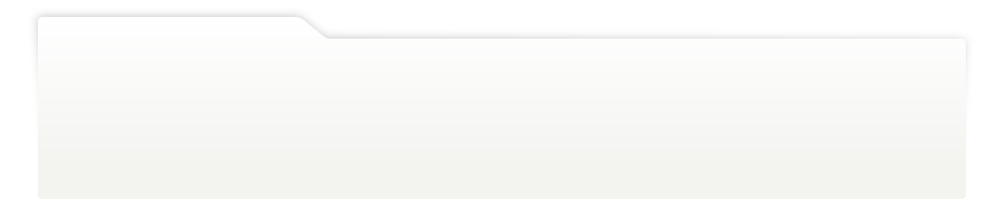
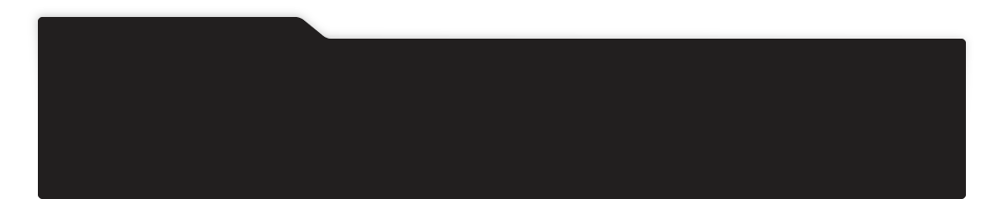
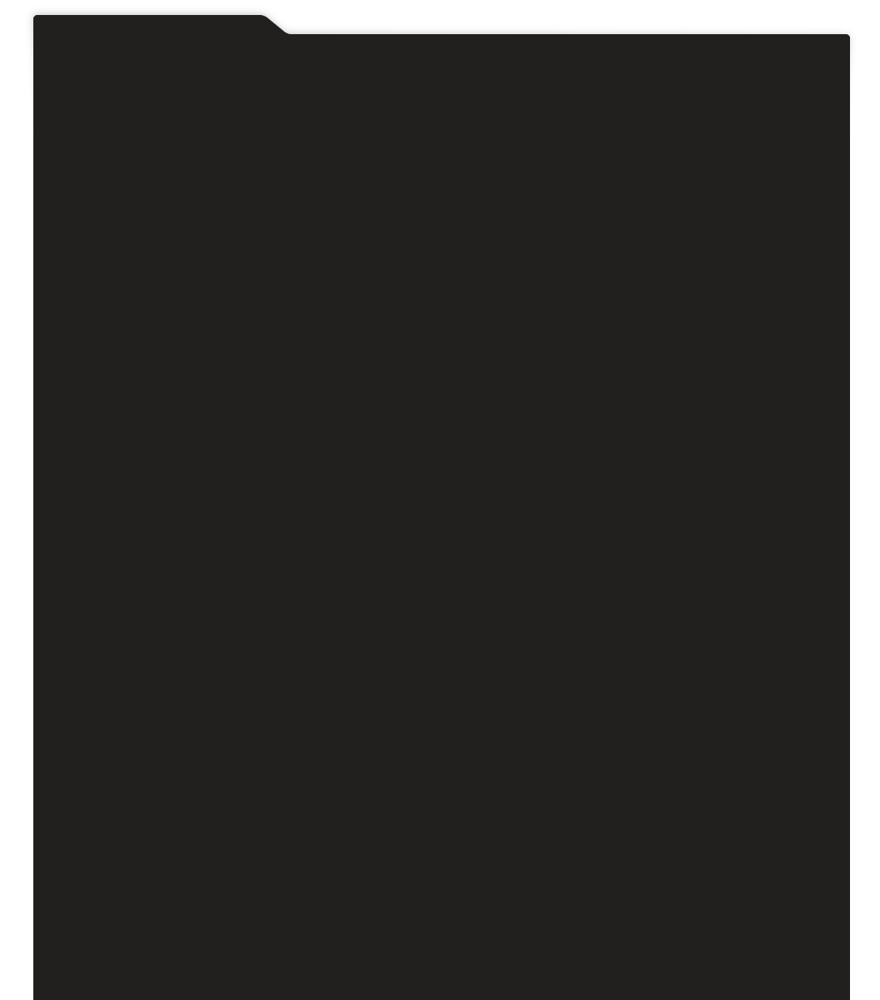
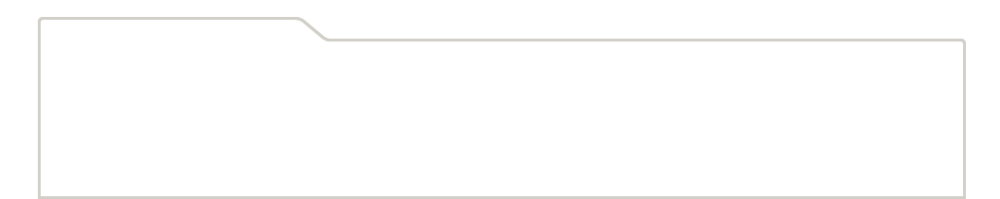
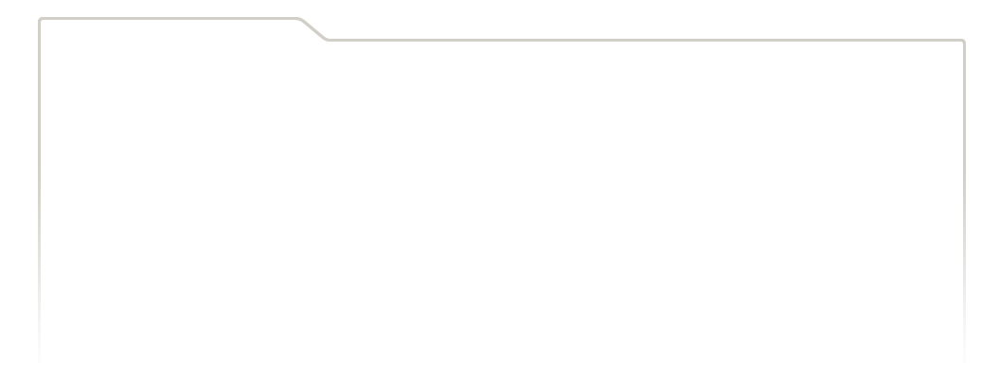
...
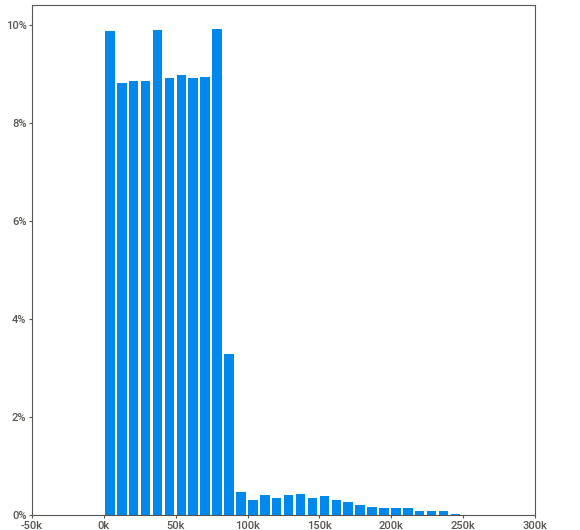
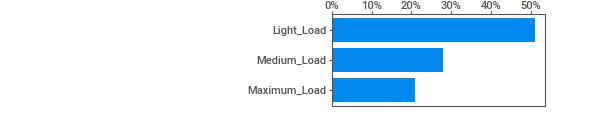
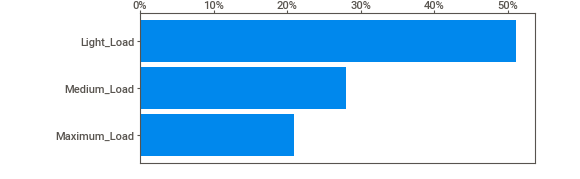
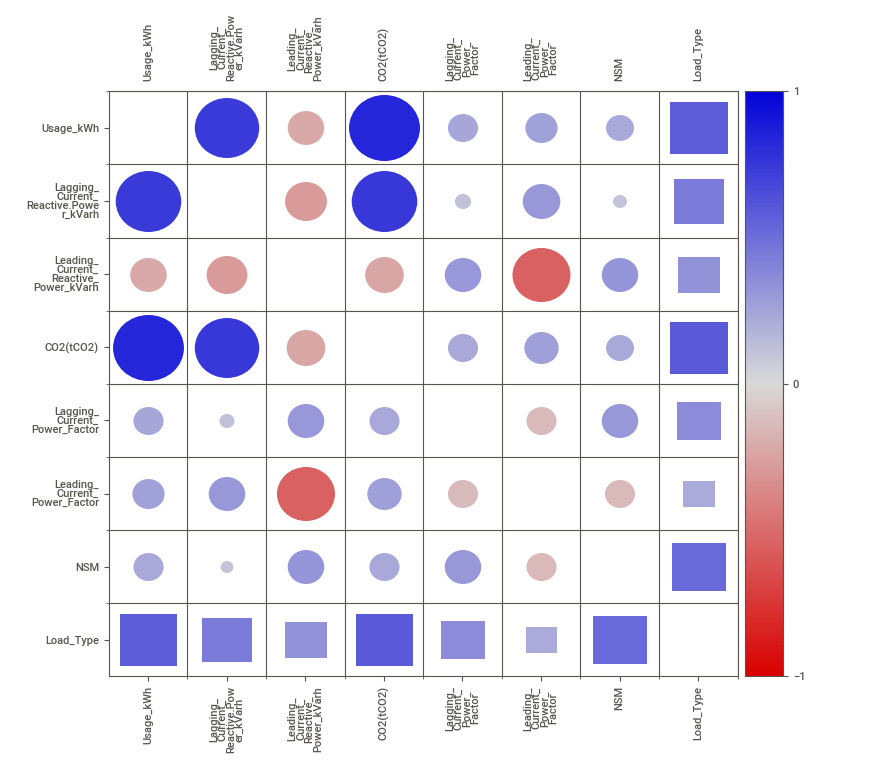
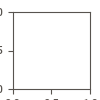

In [23]:
import sweetviz as sv

my_report = sv.analyze(train)
my_report.show_notebook() 

In [24]:
import datetime

NSM - It is calculated as the number of seconds from midnight

In [25]:
train['NSM_calculated']=train['Date_Time'].apply(lambda x: datetime.datetime.strptime(x,"%d-%m-%Y %H:%M").hour*3600+datetime.datetime.strptime(x,"%d-%m-%Y %H:%M").minute*60)

In [26]:
train['NSM'].isna().sum()

326

In [27]:
train['NSM_calculated'].isna().sum()

0

In [28]:
train.isna().sum()/len(train)*100

Date_Time                               0.000000
Usage_kWh                               4.303926
Lagging_Current_Reactive.Power_kVarh    2.471639
Leading_Current_Reactive_Power_kVarh    3.302016
CO2(tCO2)                               1.321586
Lagging_Current_Power_Factor            1.056489
Leading_Current_Power_Factor            4.233753
NSM                                     1.270906
Load_Type                               0.000000
NSM_calculated                          0.000000
dtype: float64

In [29]:
train.head()

,Date_Time,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Load_Type,NSM_calculated
0,01-01-2018 00:15,8.753692,2.95,0.0,0.0,73.210000,100.0,900.000000,Light_Load,900
1,01-01-2018 00:30,4.000000,4.46,0.0,0.0,66.770000,100.0,1800.000000,Light_Load,1800
2,01-01-2018 00:45,3.240000,3.28,0.0,0.0,70.280000,100.0,8070.880991,Light_Load,2700
3,01-01-2018 01:00,3.310000,3.56,0.0,0.0,68.090000,100.0,3600.000000,Light_Load,3600
4,01-01-2018 01:15,3.820000,4.50,0.0,0.0,133.655666,NaN,4500.000000,Light_Load,4500


In [30]:
import plotly.express as px
fig = px.scatter(train, x="NSM_calculated",y=np.arange(len(train)), color="Load_Type",hover_data=["Date_Time"])
fig.show()

In [31]:
filtered_train = train[(train['NSM_calculated'] <= 32400) | (train['NSM_calculated'] >= 83700)]
filtered_train['Load_Type'].value_counts()

Load_Type
Light_Load    10699
Name: count, dtype: int64

Timing is considered as [ exclued interval start to included interval end]
       For the first case - After 11 pm till 9am morning, the Load is Light Load
- 11:00 PM - 9:00 AM - The Load is Light Load
     <p align="center"> <img src="images/32400 [9 am].png" /></p>
     <p align="center"> <img src="images/83700.png" /></p>
- From the above plot[after zooming and analysing [Maximum times]]
    - 9 - 10 am - The Load type is generally Medium Load
   
    - 10 - 12 am - The Load type is generally Maximum Load

    - 12pm - 1 pm -The Load Type is generally Medium Load

    -- Till Feb 28,2018
     - 1pm - 5 pm - Medium Load
     - 5pm - 8 pm - Maximum Load
     - 8pm - 10 pm - Medium Load
     - 10pm - 11pm - Maximum Load

    -- From March 1, 2018
     - 1pm - 5 pm - Maximum Load
     - 5pm- 11pm - Medium Load

## How are the weekdays perform

In [32]:
train['weekday']=pd.to_datetime(train['Date_Time'],format="%d-%m-%Y %H:%M").dt.weekday
train['day']=pd.to_datetime(train['Date_Time'],format="%d-%m-%Y %H:%M").dt.day
train['month']=pd.to_datetime(train['Date_Time'],format="%d-%m-%Y %H:%M").dt.month

In [33]:
train.groupby('weekday')['Load_Type'].value_counts()

weekday  Load_Type   
0        Light_Load      1672
         Medium_Load     1184
         Maximum_Load     888
1        Light_Load      1595
         Medium_Load     1184
         Maximum_Load     888
2        Light_Load      1632
         Medium_Load     1152
         Maximum_Load     864
3        Light_Load      1632
         Medium_Load     1152
         Maximum_Load     864
4        Light_Load      1632
         Medium_Load     1152
         Maximum_Load     864
5        Light_Load      2080
         Medium_Load      896
         Maximum_Load     672
6        Light_Load      2864
         Medium_Load      448
         Maximum_Load     336
Name: count, dtype: int64

No distinctive analysis can be made here.

In [34]:
import plotly.express as px
fig = px.scatter(train, x="NSM_calculated",y='day', color="Load_Type",hover_data=["Date_Time"])
fig.show()

In [35]:
train.isna().any(axis=1).value_counts(normalize=True)

False    0.833223
True     0.166777
Name: proportion, dtype: float64

In [36]:
train.isna().any(axis=1)

0        False
1        False
2        False
3        False
4         True
         ...  
25646    False
25647    False
25648    False
25649    False
25650    False
Length: 25651, dtype: bool

In [37]:
import plotly.express as px
fig = px.scatter(train, x="NSM_calculated",y=np.arange(len(train)), color=train.isna().any(axis=1),hover_data=["Date_Time"])
fig.show()

## Is there days where there is a complete light load taken

In [38]:
train['date']=pd.to_datetime(train['Date_Time'],format="%d-%m-%Y %H:%M").dt.date

In [39]:
train.groupby('date')['Load_Type'].unique()

date
2018-01-01                               [Light_Load]
2018-01-02    [Light_Load, Medium_Load, Maximum_Load]
2018-01-03    [Light_Load, Medium_Load, Maximum_Load]
2018-01-04    [Light_Load, Medium_Load, Maximum_Load]
2018-01-05    [Light_Load, Medium_Load, Maximum_Load]
                               ...                   
2018-09-21    [Light_Load, Medium_Load, Maximum_Load]
2018-09-22                               [Light_Load]
2018-09-23                               [Light_Load]
2018-09-24                               [Light_Load]
2018-09-25                               [Light_Load]
Name: Load_Type, Length: 268, dtype: object

In [40]:
train.groupby('date')['Load_Type'].nunique().value_counts()

Load_Type
3    224
1     44
Name: count, dtype: int64

There are days where there is,
    - only one load type is taken [Light Load] [44 times]
    - 3 loads [224 times]

In [41]:
ss=train.groupby('date')['Load_Type'].nunique().eq(1)

In [42]:
light_load_dates=ss[ss].index

In [43]:
light_load_dates

Index([2018-01-01, 2018-01-06, 2018-01-07, 2018-01-21, 2018-02-04, 2018-02-10,
       2018-02-11, 2018-02-14, 2018-02-15, 2018-02-16, 2018-02-17, 2018-02-18,
       2018-02-25, 2018-03-04, 2018-03-18, 2018-03-31, 2018-04-01, 2018-04-15,
       2018-04-29, 2018-05-01, 2018-05-05, 2018-05-06, 2018-05-13, 2018-05-27,
       2018-06-02, 2018-06-03, 2018-06-09, 2018-06-10, 2018-06-17, 2018-07-01,
       2018-07-22, 2018-08-01, 2018-08-02, 2018-08-03, 2018-08-04, 2018-08-05,
       2018-08-12, 2018-08-19, 2018-08-25, 2018-09-16, 2018-09-22, 2018-09-23,
       2018-09-24, 2018-09-25],
      dtype='object', name='date')

We focus on NSM between 32400 to 83700

In [44]:
Focussed_train=train[(train['NSM_calculated'] > 32400) & (train['NSM_calculated'] < 83700)]

In [45]:
fig = px.scatter(Focussed_train, x="NSM_calculated",y=np.arange(len(Focussed_train)), color="Load_Type",hover_data=["Date_Time","day","weekday"])
fig.show()

In [46]:
Excluding_light_load_dates=Focussed_train[~Focussed_train['date'].isin(light_load_dates)]

In [47]:
fig = px.scatter(Excluding_light_load_dates, x="NSM_calculated",y=np.arange(len(Excluding_light_load_dates)), color="Load_Type",hover_data=["Date_Time","day","weekday"])
fig.show()

This states that there is only 2 modes and follows the generalised above assumptions
   
    - 9 - 10 am - The Load type is Medium Load
   
    - 10 - 12 am - The Load type is Maximum Load

    - 12pm - 1 pm -The Load Type is  Medium Load

    -- Till Feb 28,2018
     - 1pm - 5 pm - Medium Load
     - 5pm - 8 pm - Maximum Load
     - 8pm - 10 pm - Medium Load
     - 10pm - 11pm - Maximum Load

    -- From March 1, 2018
     - 1pm - 5 pm - Maximum Load
     - 5pm- 11pm - Medium Load

I find it difficult to assess the pattern in the light_load_dates, which could take place of other circumstances as the industrial holiday, maintenance, etc.

See the ml_model_building first phase.

# Second Analysis

In [48]:
light_load_dates

Index([2018-01-01, 2018-01-06, 2018-01-07, 2018-01-21, 2018-02-04, 2018-02-10,
       2018-02-11, 2018-02-14, 2018-02-15, 2018-02-16, 2018-02-17, 2018-02-18,
       2018-02-25, 2018-03-04, 2018-03-18, 2018-03-31, 2018-04-01, 2018-04-15,
       2018-04-29, 2018-05-01, 2018-05-05, 2018-05-06, 2018-05-13, 2018-05-27,
       2018-06-02, 2018-06-03, 2018-06-09, 2018-06-10, 2018-06-17, 2018-07-01,
       2018-07-22, 2018-08-01, 2018-08-02, 2018-08-03, 2018-08-04, 2018-08-05,
       2018-08-12, 2018-08-19, 2018-08-25, 2018-09-16, 2018-09-22, 2018-09-23,
       2018-09-24, 2018-09-25],
      dtype='object', name='date')

In [49]:
full_day_light_load=Focussed_train[Focussed_train['date'].isin(light_load_dates)]

In [50]:
full_day_light_load.head()

,Date_Time,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Load_Type,NSM_calculated,weekday,day,month,date
36,01-01-2018 09:15,6.231377,0.0,16.960000,0.0,100.0,20.760000,33300.000000,Light_Load,33300,0,1,1,2018-01-01
37,01-01-2018 09:30,4.030000,0.0,21.280000,0.0,100.0,33.919005,34200.000000,Light_Load,34200,0,1,1,2018-01-01
38,01-01-2018 09:45,3.920000,0.0,29.314411,0.0,100.0,19.980000,85881.718202,Light_Load,35100,0,1,1,2018-01-01
39,01-01-2018 10:00,3.640000,0.0,16.880000,0.0,100.0,21.080000,36000.000000,Light_Load,36000,0,1,1,2018-01-01
40,01-01-2018 10:15,4.070000,0.0,22.320000,0.0,100.0,17.940000,36900.000000,Light_Load,36900,0,1,1,2018-01-01


In [51]:
full_day_light_load.isna().sum()

Date_Time                                 0
Usage_kWh                               101
Lagging_Current_Reactive.Power_kVarh     58
Leading_Current_Reactive_Power_kVarh     94
CO2(tCO2)                                34
Lagging_Current_Power_Factor             28
Leading_Current_Power_Factor            101
NSM                                      24
Load_Type                                 0
NSM_calculated                            0
weekday                                   0
day                                       0
month                                     0
date                                      0
dtype: int64

In [52]:
train.head()

,Date_Time,Usage_kWh,Lagging_Current_Reactive.Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2(tCO2),Lagging_Current_Power_Factor,Leading_Current_Power_Factor,NSM,Load_Type,NSM_calculated,weekday,day,month,date
0,01-01-2018 00:15,8.753692,2.95,0.0,0.0,73.210000,100.0,900.000000,Light_Load,900,0,1,1,2018-01-01
1,01-01-2018 00:30,4.000000,4.46,0.0,0.0,66.770000,100.0,1800.000000,Light_Load,1800,0,1,1,2018-01-01
2,01-01-2018 00:45,3.240000,3.28,0.0,0.0,70.280000,100.0,8070.880991,Light_Load,2700,0,1,1,2018-01-01
3,01-01-2018 01:00,3.310000,3.56,0.0,0.0,68.090000,100.0,3600.000000,Light_Load,3600,0,1,1,2018-01-01
4,01-01-2018 01:15,3.820000,4.50,0.0,0.0,133.655666,NaN,4500.000000,Light_Load,4500,0,1,1,2018-01-01


# Replacing missing values with their weekdays mean, mode, median with plots to justify

In [53]:
# Rename column 'Lagging_Current_Reactive.Power_kVarh' to 'Lagging_Current_Reactive_Power_kVarh'
train = train.rename(columns={'Lagging_Current_Reactive.Power_kVarh': 'Lagging_Current_Reactive_Power_kVarh'})
# Rename column 'CO2(tCO2)' to 'CO2'
train = train.rename(columns={'CO2(tCO2)': 'CO2'})
train.groupby(['weekday']).agg(Lagging_Current_Reactive_Power_kVarh_mean=('Lagging_Current_Reactive_Power_kVarh', 'mean'), Leading_Current_Reactive_Power_kVarh_mean=('Leading_Current_Reactive_Power_kVarh', 'mean'), CO2_mean=('CO2', 'mean'),
                                    Usage_kWh_mean=('Usage_kWh', 'mean')).reset_index()

,weekday,Lagging_Current_Reactive_Power_kVarh_mean,Leading_Current_Reactive_Power_kVarh_mean,CO2_mean,Usage_kWh_mean
0,0,18.167202,2.908234,0.016416,38.511432
1,1,18.956808,2.656238,0.017407,40.600941
2,2,17.066708,3.708439,0.015856,37.151957
3,3,19.844102,2.793608,0.017673,40.382161
4,4,18.302957,3.127549,0.016733,38.593987
5,5,6.557533,7.254657,0.006912,17.637845
6,6,3.708991,8.933902,0.002342,8.704437


In [54]:
train.groupby(['weekday']).agg(Lagging_Current_Reactive_Power_kVarh_median=('Lagging_Current_Reactive_Power_kVarh', 'median'), Leading_Current_Reactive_Power_kVarh_median=('Leading_Current_Reactive_Power_kVarh', 'median'), CO2_median=('CO2', 'median'),
                                    Usage_kWh_median=('Usage_kWh', 'median')).reset_index()


,weekday,Lagging_Current_Reactive_Power_kVarh_median,Leading_Current_Reactive_Power_kVarh_median,CO2_median,Usage_kWh_median
0,0,5.870000,0.000000,0.00,9.833988
1,1,7.223411,0.000000,0.01,28.010000
2,2,5.690000,0.000000,0.00,8.311119
3,3,7.165000,0.000000,0.01,27.360000
4,4,6.370000,0.000000,0.00,15.723587
5,5,3.920000,0.000000,0.00,4.000000
6,6,0.860000,3.498049,0.00,3.310000


In [55]:
train.groupby(['weekday']).agg(Lagging_Current_Reactive_Power_kVarh_mode=('Lagging_Current_Reactive_Power_kVarh',lambda s: s.value_counts().index[0]), Leading_Current_Reactive_Power_kVarh_mode=('Leading_Current_Reactive_Power_kVarh',lambda s: s.value_counts().index[0]), CO2_mode=('CO2',lambda s: s.value_counts().index[0]),
                                    Usage_kWh_mode=('Usage_kWh',lambda s: s.value_counts().index[0])).reset_index()

,weekday,Lagging_Current_Reactive_Power_kVarh_mode,Leading_Current_Reactive_Power_kVarh_mode,CO2_mode,Usage_kWh_mode
0,0,0.0,0.0,0.0,2.84
1,1,0.0,0.0,0.0,2.88
2,2,0.0,0.0,0.0,2.92
3,3,0.0,0.0,0.0,3.06
4,4,0.0,0.0,0.0,2.88
5,5,0.0,0.0,0.0,2.88
6,6,0.0,0.0,0.0,3.06


In [56]:
fig = px.box(train, x="weekday", y="Usage_kWh")
fig.show()

Mean values of Usage_Kwh are constant and decreases in weekends. It is not as volatile with comparison with the median. Generally Company function effectively in weekdays and consume more power.

In [57]:
fig = px.box(train,x="weekday", y="Leading_Current_Reactive_Power_kVarh")
fig.show()

We prefer Mean for leading_current_reactive_power

In [58]:
fig = px.box(train, x="weekday", y="Lagging_Current_Reactive_Power_kVarh")
fig.show()

For  Lagging_Current_Reactive_Power_KVarh, We consider the median values as they are skewed.

In [59]:
fig = px.box(train, x="weekday", y="CO2")
fig.show()

For CO2, its better to choose the mean value across weekdays rather than median.

As most of the median is 0.

In [60]:
train['NSM_calculated'].min(),train['NSM_calculated'].max()

(0, 85500)

In [61]:

def clean_data(train):
    # Rename column 'Lagging_Current_Reactive.Power_kVarh' to 'Lagging_Current_Reactive_Power_kVarh'
    train = train.rename(columns={'Lagging_Current_Reactive.Power_kVarh': 'Lagging_Current_Reactive_Power_kVarh'})
    # Rename column 'CO2(tCO2)' to 'CO2'
    train = train.rename(columns={'CO2(tCO2)': 'CO2'})
    # Scale column 'NSM_calculated' between 0 and 1
    new_min, new_max = 0, 1
    old_min, old_max = 0,85500
    train['NSM_calculated'] = (train['NSM_calculated'] - old_min) / (old_max - old_min) * (new_max - new_min) + new_min
    
    Impute_dataframe=train.groupby(['weekday']).agg(Lagging_Current_Reactive_Power_kVarh_mean=('Lagging_Current_Reactive_Power_kVarh','mean'), Leading_Current_Reactive_Power_kVarh_mean=('Leading_Current_Reactive_Power_kVarh','mean'), CO2_mean=('CO2','mean'),
                                    Usage_kWh_mean=('Usage_kWh','mean')).reset_index()
    weekday_means = Impute_dataframe.set_index('weekday').to_dict()

    columns_to_fill=['Lagging_Current_Reactive_Power_kVarh','Leading_Current_Reactive_Power_kVarh','CO2','Usage_kWh']
    for column in columns_to_fill:
        train[column].fillna(train['weekday'].map(weekday_means[f'{column}_mean']), inplace=True)
    
    train['actual_load_from_formula']=(train['Usage_kWh']**2+abs(train['Lagging_Current_Reactive_Power_kVarh']-train['Leading_Current_Reactive_Power_kVarh'])**2)**0.5
    train = train.drop(columns=['Lagging_Current_Power_Factor','Leading_Current_Power_Factor','NSM','date','Date_Time'])

    return train

train_clean = clean_data(train.copy())
train_clean.head()

,Usage_kWh,Lagging_Current_Reactive_Power_kVarh,Leading_Current_Reactive_Power_kVarh,CO2,Load_Type,NSM_calculated,weekday,day,month,actual_load_from_formula
0,8.753692,2.95,0.0,0.0,Light_Load,0.010526,0,1,1,9.237404
1,4.000000,4.46,0.0,0.0,Light_Load,0.021053,0,1,1,5.990960
2,3.240000,3.28,0.0,0.0,Light_Load,0.031579,0,1,1,4.610423
3,3.310000,3.56,0.0,0.0,Light_Load,0.042105,0,1,1,4.861039
4,3.820000,4.50,0.0,0.0,Light_Load,0.052632,0,1,1,5.902745


In [62]:
train_clean.isna().sum()

Usage_kWh                               0
Lagging_Current_Reactive_Power_kVarh    0
Leading_Current_Reactive_Power_kVarh    0
CO2                                     0
Load_Type                               0
NSM_calculated                          0
weekday                                 0
day                                     0
month                                   0
actual_load_from_formula                0
dtype: int64

We removed power factor attributes as these are ratios which has to be range from 0 to 1.
But we can take them as percentages.Still they don't provide adequate importance in the dataset.

According to the problem statement, We are not informed about the description of the power factor attributes.
Thus making it clear to ignore those attributes.
